# 2 - Model definition, training and saving
In this notebook we will:
1. Load and prepare our dataset.
2. Create and configure a pre-trained model from the detectron2 model zoo. 
3. Train our custom model on our dataset of labelled SEM images. 
4. Perform inference to test our model.
5. Save the model to a file for later use.

In [0]:
gpu_info = !nvidia-smi
gpu_info = '\n'.join(gpu_info)
if gpu_info.find('failed') >= 0:
  print('Select the Runtime -> "Change runtime type" menu to enable GPU accelerator, ')
  print('and then re-execute this cell.')
else:
  print(gpu_info)

Sat May 30 20:00:18 2020       
+-----------------------------------------------------------------------------+
| NVIDIA-SMI 440.82       Driver Version: 418.67       CUDA Version: 10.1     |
|-------------------------------+----------------------+----------------------+
| GPU  Name        Persistence-M| Bus-Id        Disp.A | Volatile Uncorr. ECC |
| Fan  Temp  Perf  Pwr:Usage/Cap|         Memory-Usage | GPU-Util  Compute M. |
|===============================+======================+======================|
|   0  Tesla P100-PCIE...  Off  | 00000000:00:04.0 Off |                    0 |
| N/A   32C    P0    27W / 250W |      0MiB / 16280MiB |      0%      Default |
+-------------------------------+----------------------+----------------------+
                                                                               
+-----------------------------------------------------------------------------+
| Processes:                                                       GPU Memory |
|  GPU  

If you see a prompt above to "Change runtime type" then you are not running a GPU instance. Follow the instructions above to enable the GPU.

## Install detectron2
We will be using Facebook's [detectron2](https://github.com/facebookresearch/detectron2) library to train our model. First we need to install it and its dependencies.

In [0]:
# install dependencies: (use cu101 because colab has CUDA 10.1)
!pip install -U torch==1.5 torchvision==0.6 -f https://download.pytorch.org/whl/cu101/torch_stable.html 
!pip install cython pyyaml==5.1
!pip install -U 'git+https://github.com/cocodataset/cocoapi.git#subdirectory=PythonAPI'
import torch, torchvision
print(torch.__version__, torch.cuda.is_available())
!gcc --version

Looking in links: https://download.pytorch.org/whl/cu101/torch_stable.html
Requirement already up-to-date: torch==1.5 in /usr/local/lib/python3.6/dist-packages (1.5.0+cu101)
Requirement already up-to-date: torchvision==0.6 in /usr/local/lib/python3.6/dist-packages (0.6.0+cu101)
     |████████████████████████████████| 276kB 8.7MB/s 
  Created wheel for pyyaml: filename=PyYAML-5.1-cp36-cp36m-linux_x86_64.whl size=44074 sha256=e51d2befcf15175e395c96403b52594c962ae88110810919bd515178dc893091
  Stored in directory: /root/.cache/pip/wheels/ad/56/bc/1522f864feb2a358ea6f1a92b4798d69ac783a28e80567a18b
Successfully built pyyaml
  Found existing installation: PyYAML 3.13
    Uninstalling PyYAML-3.13:
      Successfully uninstalled PyYAML-3.13
  Cloning https://github.com/cocodataset/cocoapi.git to /tmp/pip-req-build-2zass9tg
  Running command git clone -q https://github.com/cocodataset/cocoapi.git /tmp/pip-req-build-2zass9tg
  Created wheel for pycocotools: filename=pycocotools-2.0-cp36-cp36m-lin

In [0]:
# install detectron2:
!pip install detectron2==0.1.2 -f https://dl.fbaipublicfiles.com/detectron2/wheels/cu101/index.html

Looking in links: https://dl.fbaipublicfiles.com/detectron2/wheels/cu101/index.html
     |████████████████████████████████| 6.2MB 2.8MB/s 
  Created wheel for fvcore: filename=fvcore-0.1.1.post200513-cp36-none-any.whl size=40893 sha256=1654c281fa8f8bfe9b417652b4d6cdb83203de578483634aa8b559c5bca47878
  Stored in directory: /root/.cache/pip/wheels/a2/f6/77/551770c4b8cd75e9335cd0acf59c08d60a8684048b19da6702
Successfully built fvcore


In [0]:
# Setup detectron2 logger
import detectron2
from detectron2.utils.logger import setup_logger
setup_logger()

# Import some common libraries
import numpy as np
import os, cv2, random, json
from glob import glob
from google.colab.patches import cv2_imshow

# Import some common detectron2 utilities
from detectron2 import model_zoo
from detectron2.engine import DefaultPredictor
from detectron2.config import get_cfg
from detectron2.utils.visualizer import Visualizer
from detectron2.data import MetadataCatalog

## Introduction
In this section, we will train an existing detectron2 model on our labelled SEM image dataset that we prepared in [Notebook 1](https://colab.research.google.com/github/Martin09/DeepSEM/blob/master/segmentation-NWs/1_nw_seg_image_prep.ipynb) and labelled with [Labelbox](https://labelbox.com). We will use a custom labelled nanowire detection dataset which can be downloaded [here](https://github.com/Martin09/DeepSEM/raw/master/segmentation-NWs/datasets/WJ_NWs_D1-17-02-17-C_processed.zip). This dataset has been labelled with three classes: 
*   Nanowire
*   Droplet
*   Parasitic

From this, we will train a custom image segmentation model from an existing model pre-trained on the COCO dataset, available in detectron2's model zoo.

Note: the COCO dataset does not have any of these categories by default so we will have to perform transfer learning to get the model to detect them.

## 2.1 - Preparing our dataset

In [0]:
# # Clone the NW repository
# !rm -rf DeepSEM
# !git clone https://github.com/Martin09/DeepSEM

# OR

# Load from my GoogleDrive
from google.colab import drive
import sys
drive.mount('/content/gdrive/')
# sys.path.append('/content/gdrive/My Drive/LMSC/MachineLearning/Datasets')
%cd "/content/gdrive/My Drive/LMSC/MachineLearning/Colab"

Go to this URL in a browser: https://accounts.google.com/o/oauth2/auth?client_id=947318989803-6bn6qk8qdgf4n4g3pfee6491hc0brc4i.apps.googleusercontent.com&redirect_uri=urn%3aietf%3awg%3aoauth%3a2.0%3aoob&response_type=code&scope=email%20https%3a%2f%2fwww.googleapis.com%2fauth%2fdocs.test%20https%3a%2f%2fwww.googleapis.com%2fauth%2fdrive%20https%3a%2f%2fwww.googleapis.com%2fauth%2fdrive.photos.readonly%20https%3a%2f%2fwww.googleapis.com%2fauth%2fpeopleapi.readonly

Enter your authorization code:
··········
Mounted at /content/gdrive/
/content/gdrive/My Drive/LMSC/MachineLearning/Colab


## Download the dataset

In [0]:
import urllib.request
import pandas as pd
import time
from PIL import Image
from pathlib import Path
from tqdm import tqdm

class_dict = {'droplet': '1',
              'nanowire': '2',
              'parasitic': '3'}

dataset_dir = './DeepSEM/datasets/WJ_NWs_D1-17-02-17-C_processed'

## Download the dataset

Can either download the dataset directly as a zip file and simply unpack it:

In [0]:
# # CAUTION, WE WILL REMOVE EXISTING DATASET FOLDER!
# !rm -rf $dataset_dir
# !wget https://github.com/Martin09/DeepSEM/raw/master/datasets/WJ_NWs_D1-17-02-17-C_processed.zip
# !unzip WJ_NWs_D1-17-02-17-C_processed.zip -d $dataset_dir
# !rm WJ_NWs_D1-17-02-17-C_processed.zip

OR, can download and build up the dataset from a LabelBox JSON export file (takes about 30s/image to download, depending on size and number of segmentation masks):

In [0]:
# # CAUTION, WE WILL REMOVE EXISTING DATASET FOLDER!
# import json

# # Load json data
# json_file = "./DeepSEM/datasets/export-2020-05-04T12_28_16.320Z.json"
# with open(json_file) as f:
#     data = json.load(f)
# dataset_dir = './DeepSEM/datasets/WJ_NWs_D1-17-02-17-C_processed/'
# !rm -rf $dataset_dir

# # Perform train/val split by random choice
# n_images = len(data)
# i_val = np.random.choice(list(range(n_images)), int(n_images*0.1), replace=False)

# # Loop over all the images (one image per row)
# for i, img in enumerate(tqdm(data, unit='image')):
#     image_name = img['External ID']

#     # Output image into val and train directories randomly
#     if i in i_val:
#         example_dest_dir = dataset_dir + 'val/' + image_name.split(".")[0] + '/'
#     else:
#         example_dest_dir = dataset_dir + 'train/' + image_name.split(".")[0] + '/'

#     # If there are labels for this image, create a folder for it and save the image
#     if img['Label']['objects'] and len(img['Label']['objects']) > 0:
#         Path(example_dest_dir + 'images/').mkdir(parents=True, exist_ok=True)
#         image_url = img['Labeled Data']
#         time.sleep(0.1)  # To not overload the LabelBox servers with requests
#         image = Image.open(urllib.request.urlopen(image_url))
#         image.save(example_dest_dir + 'images/' + image_name)
    
#     # For each label, download the mask PNG file from labelbox and save it to relevant path
#     for label in img['Label']['objects']:
#         mask_class = class_dict[label['value']]
#         mask_name = label['featureId']
#         mask_url = label['instanceURI']

#         mask_dest_dir = example_dest_dir + 'masks/' + mask_class + '/'
#         Path(mask_dest_dir).mkdir(parents=True, exist_ok=True)
#         time.sleep(0.1)  # To not overload the LabelBox servers with requests
#         mask = Image.open(urllib.request.urlopen(mask_url))
#         mask.save(mask_dest_dir + mask_name +'.png', bit=1)

## Calculate mean pixel intensity of dataset



In [0]:
# Calcualte dataset mean pixel intensity
images = glob(dataset_dir + '/train/*/images/*.png', recursive=True)

min_pixel_intensity = np.infty
max_pixel_intensity = -np.infty
mean_pixel_intensity = 0
for img in images:
    im = cv2.imread(img,cv2.IMREAD_GRAYSCALE)
    min_pixel_intensity = min([np.min(im), min_pixel_intensity])
    max_pixel_intensity = max([np.max(im), max_pixel_intensity])
    mean_pixel_intensity += np.mean(im)
mean_pixel_intensity /= len(images)

print('The min pixel intesity is: {:.2f}'.format(min_pixel_intensity))
print('The max pixel intesity is: {:.2f}'.format(max_pixel_intensity))
print('The mean pixel intesity is: {:.2f}'.format(mean_pixel_intensity))
mpi = mean_pixel_intensity

The min pixel intesity is: 30.00
The max pixel intesity is: 255.00
The mean pixel intesity is: 95.49


Register the nanowire dataset to detectron2, following the [detectron2 custom dataset tutorial](https://detectron2.readthedocs.io/tutorials/datasets.html).
Here, the dataset is in its custom format, therefore we write a function to parse it and prepare it into detectron2's standard format. See the tutorial for more details.


In [0]:
# if your dataset is in COCO format, this cell can be replaced by the following three lines:
# from detectron2.data.datasets import register_coco_instances
# register_coco_instances("my_dataset_train", {}, "json_annotation_train.json", "path/to/image/dir")
# register_coco_instances("my_dataset_val", {}, "json_annotation_val.json", "path/to/image/dir")

import os
import numpy as np
import json
from detectron2.structures import BoxMode
import pycocotools

def get_bbox(msk):
    rows = np.any(msk, axis=1)
    cols = np.any(msk, axis=0)
    ymin, ymax = np.where(rows)[0][[0, -1]]
    xmin, xmax = np.where(cols)[0][[0, -1]]
    return xmin, ymin, xmax, ymax

def get_nw_mask_dicts_from_labelbox(dataset_folder):

    dataset_dicts = []
    for idx, entry in enumerate(os.scandir(dataset_folder)):
        if entry.is_file():
            continue
        
        image_file = next(os.scandir(entry.path+'/images'))
        
        record = {}
        record["image_id"] = idx
        record["file_name"] = image_file.path
        
        height, width = cv2.imread(image_file.path).shape[:2]
        record["height"] = height
        record["width"] = width    

        objs = []
        for category in os.scandir(entry.path+'/masks'):
            for mask_file in os.scandir(category.path):

                mask = cv2.imread(mask_file.path, cv2.IMREAD_GRAYSCALE)
                mask = (mask/mask.max()).astype(np.uint8)  # Convert to integer mask
                try:
                    obj = {
                        "bbox": list(get_bbox(mask)),
                        "bbox_mode": BoxMode.XYXY_ABS,
                        "segmentation": pycocotools.mask.encode(np.asarray(mask, order="F")),
                        "category_id": int(category.name)-1,
                    }
                except IndexError: # Can happen if we have an emtpy mask and try to find its bbox, for example
                    continue
                objs.append(obj)
            record["annotations"] = objs
        dataset_dicts.append(record)
    return dataset_dicts

from detectron2.data import DatasetCatalog, MetadataCatalog
DatasetCatalog.clear()

for d in ["train", "val"]:
    DatasetCatalog.register("nw_masks_" + d, lambda d=d: get_nw_mask_dicts_from_labelbox(dataset_dir + '/' + d))
    MetadataCatalog.get("nw_masks_" + d).set(thing_classes=["droplet","nanowire","parasitic"])
nanowire_metadata = MetadataCatalog.get("nw_masks_train")

To verify the data loading is correct, let's visualize the annotations of randomly selected samples in the training set:



/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:41: RuntimeWarning: invalid value encountered in true_divide


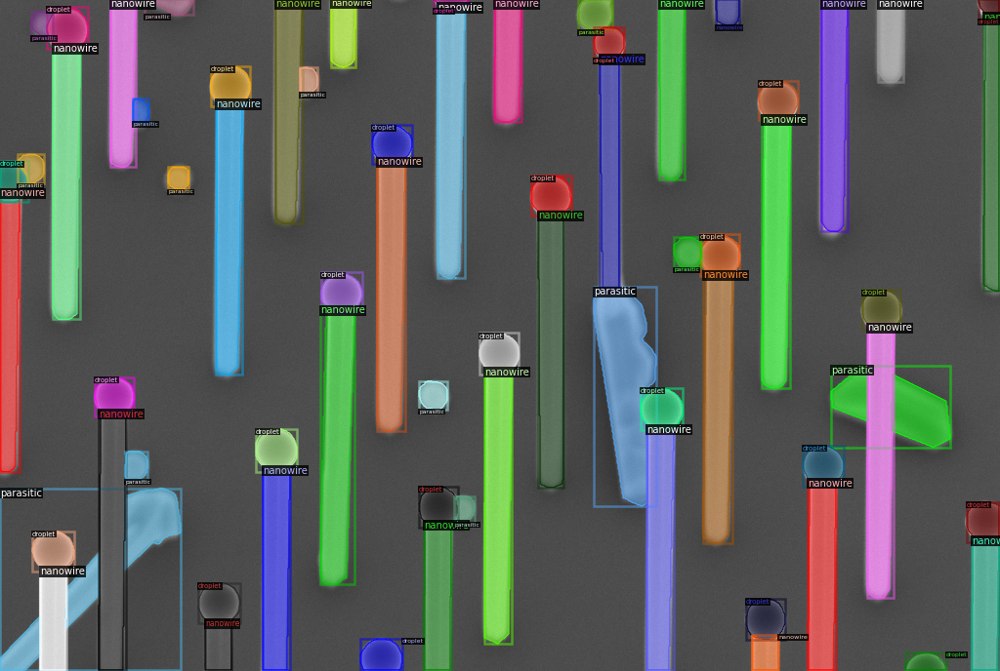

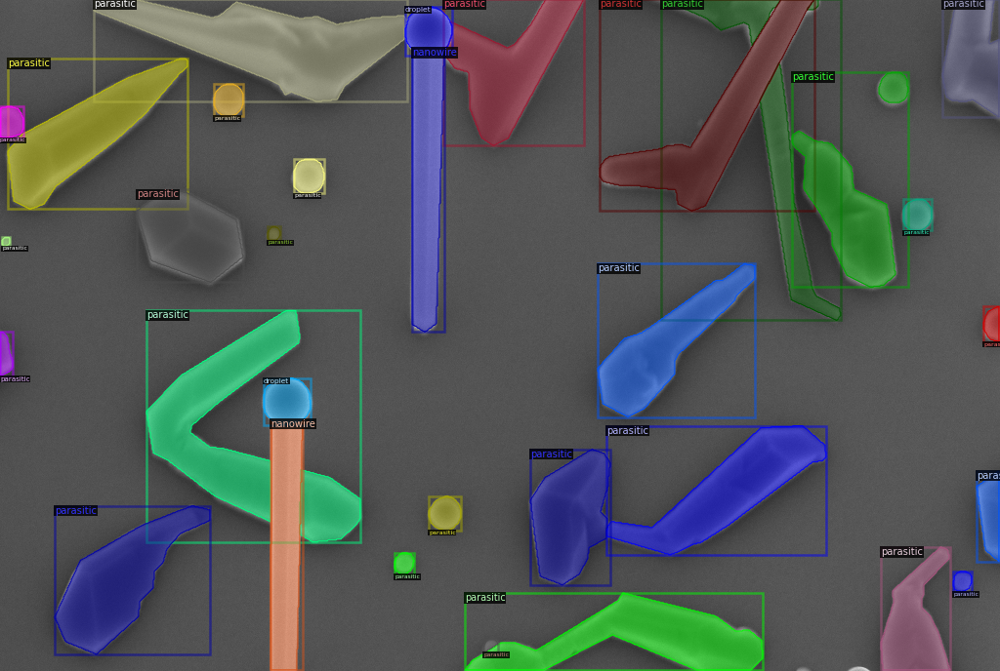

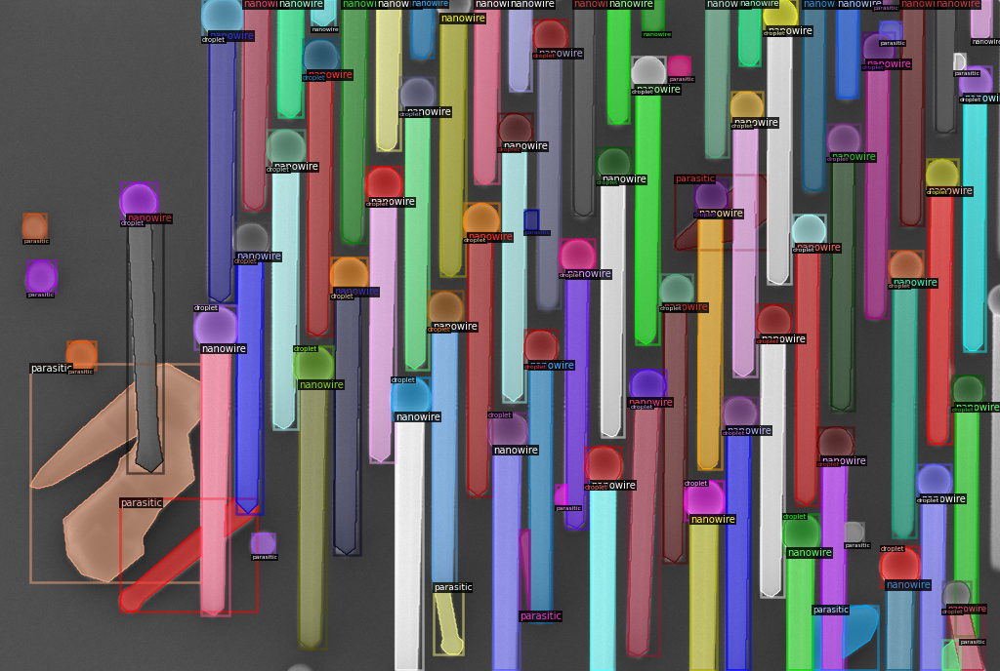

In [0]:
dataset_dicts = get_nw_mask_dicts_from_labelbox(dataset_dir + "/train")
for d in random.sample(dataset_dicts, 3):
    img = cv2.imread(d["file_name"])

    visualizer = Visualizer(img[:, :, ::-1], metadata=nanowire_metadata, scale=1.0)
    vis = visualizer.draw_dataset_dict(d)
    cv2_imshow(vis.get_image()[:, :, ::-1])

## Train!

Now, let's fine-tune a coco-pretrained R50-FPN Mask R-CNN model on the balloon dataset. It takes ~6 minutes to train 300 iterations on Colab's K80 GPU, or ~2 minutes on a P100 GPU.


In [0]:
from detectron2.engine import DefaultTrainer
from detectron2.config import get_cfg
import datetime

timestamp = datetime.datetime.now().strftime('%Y-%m-%d_%H-%M-%S')
output_dir = './DeepSEM/output/' + timestamp

cfg = get_cfg()
cfg.merge_from_file(model_zoo.get_config_file("COCO-InstanceSegmentation/mask_rcnn_R_50_FPN_3x.yaml"))
cfg.INPUT.MASK_FORMAT='bitmask'
cfg.OUTPUT_DIR = output_dir
cfg.DATASETS.TRAIN = ("nw_masks_train",)
# cfg.DATASETS.TEST = ("nw_masks_val",)
cfg.DATASETS.TEST = ()
cfg.DATALOADER.NUM_WORKERS = 8
cfg.MODEL.WEIGHTS = model_zoo.get_checkpoint_url("COCO-InstanceSegmentation/mask_rcnn_R_50_FPN_3x.yaml")  # Let training initialize from model zoo
cfg.SOLVER.IMS_PER_BATCH = 8
cfg.SOLVER.BASE_LR = 0.05  # learning rate
cfg.SOLVER.MAX_ITER = 20000  # 1000 is decent for initial testing
cfg.SOLVER.CHECKPOINT_PERIOD = 5000  # Save a checkpoint after every this number of iterations

# Learning rate warmup and decay
cfg.SOLVER.WARMUP_FACTOR = 1/1000.  # Learning starts at BASE_LR * WU_FACTOR
cfg.SOLVER.WARMUP_ITERS = 1000  # Number of iterations for warm-up phase
cfg.SOLVER.WARMUP_METHOD = "linear"
cfg.SOLVER.GAMMA = 0.5
# cfg.SOLVER.STEPS = (100,200,300,)  # List of iteration numbers at which to decrease learning rate by factor GAMMA.
cfg.SOLVER.STEPS = tuple(range(0,cfg.SOLVER.MAX_ITER,2000)) # Decrease LR every 1000 steps

# Validation set
cfg.TEST.EVAL_PERIOD = 1000
cfg.TEST.DETECTIONS_PER_IMAGE = 1000

# Don't scale the input images
cfg.INPUT.MIN_SIZE_TEST = 0
cfg.INPUT.MAX_SIZE_TEST = 99999
cfg.INPUT.MIN_SIZE_TRAIN = 0
cfg.INPUT.MAX_SIZE_TRAIN = 99999
# cfg.MODEL.ANCHOR_GENERATOR.ANGLES = [[0]]
# cfg.MODEL.RPN.IN_FEATURES = ['p2', 'p2', 'p3', 'p4', 'p5', 'p6']
# cfg.MODEL.ANCHOR_GENERATOR.ASPECT_RATIOS = [[0.25, 0.5, 1.0, 2.0, 4.0, 8.0]]
# cfg.MODEL.ANCHOR_GENERATOR.SIZES = [[4], [8], [16], [32], [64], [128]]
cfg.MODEL.PIXEL_MEAN = [mpi, mpi, mpi] 
cfg.MODEL.PIXEL_STD = [1.0, 1.0, 1.0]
# cfg.MODEL.ROI_HEADS.BATCH_SIZE_PER_IMAGE = 4096
# cfg.MODEL.ROI_HEADS.POSITIVE_FRACTION = 0.5
cfg.MODEL.ROI_HEADS.IOU_THRESHOLDS = [0.5] # Intersection over union threshold
cfg.MODEL.ROI_HEADS.NUM_CLASSES = 3 # We have three classification classes 
# cfg.MODEL.RPN.POST_NMS_TOPK_TRAIN = 4000
# cfg.MODEL.RPN.PRE_NMS_TOPK_TRAIN = 4000

In [0]:
# Look at training curves in tensorboard:
# %load_ext tensorboard
%reload_ext tensorboard
%tensorboard --logdir ./DeepSEM/output

Reusing TensorBoard on port 6006 (pid 461), started 10:46:20 ago. (Use '!kill 461' to kill it.)

<IPython.core.display.Javascript object>

In [0]:
# Start training
os.makedirs(cfg.OUTPUT_DIR, exist_ok=True)
trainer = DefaultTrainer(cfg) 
trainer.resume_or_load(resume=False)
trainer.train()

[05/30 20:07:28 d2.engine.defaults]: Model:
GeneralizedRCNN(
  (backbone): FPN(
    (fpn_lateral2): Conv2d(256, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output2): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (fpn_lateral3): Conv2d(512, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output3): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (fpn_lateral4): Conv2d(1024, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output4): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (fpn_lateral5): Conv2d(2048, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output5): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (top_block): LastLevelMaxPool()
    (bottom_up): ResNet(
      (stem): BasicStem(
        (conv1): Conv2d(
          3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False
          (norm): FrozenBatchNorm2d(num_features=64, eps=1e-05)
        )
      )
      (res

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:41: RuntimeWarning: invalid value encountered in true_divide


[05/30 20:07:35 d2.data.build]: Removed 0 images with no usable annotations. 21 images left.
[05/30 20:07:35 d2.data.build]: Distribution of instances among all 3 categories:
|  category  | #instances   |  category  | #instances   |  category  | #instances   |
|:----------:|:-------------|:----------:|:-------------|:----------:|:-------------|
|  droplet   | 191          |  nanowire  | 228          | parasitic  | 411          |
|            |              |            |              |            |              |
|   total    | 830          |            |              |            |              |
[05/30 20:07:35 d2.data.common]: Serializing 21 elements to byte tensors and concatenating them all ...
[05/30 20:07:35 d2.data.common]: Serialized dataset takes 0.20 MiB
[05/30 20:07:35 d2.data.detection_utils]: TransformGens used in training: [ResizeShortestEdge(short_edge_length=(0, 0), max_size=99999, sample_style='choice'), RandomFlip()]
[05/30 20:07:35 d2.data.build]: Using training sam

model_final_f10217.pkl: 178MB [00:18, 9.40MB/s]                           
'roi_heads.box_predictor.cls_score.weight' has shape (81, 1024) in the checkpoint but (4, 1024) in the model! Skipped.
'roi_heads.box_predictor.cls_score.bias' has shape (81,) in the checkpoint but (4,) in the model! Skipped.
'roi_heads.box_predictor.bbox_pred.weight' has shape (320, 1024) in the checkpoint but (12, 1024) in the model! Skipped.
'roi_heads.box_predictor.bbox_pred.bias' has shape (320,) in the checkpoint but (12,) in the model! Skipped.
'roi_heads.mask_head.predictor.weight' has shape (80, 256, 1, 1) in the checkpoint but (3, 256, 1, 1) in the model! Skipped.
'roi_heads.mask_head.predictor.bias' has shape (80,) in the checkpoint but (3,) in the model! Skipped.


[05/30 20:08:01 d2.engine.train_loop]: Starting training from iteration 0
[05/30 20:08:38 d2.utils.events]:  eta: 9:28:54  iter: 19  total_loss: 2.389  loss_cls: 0.767  loss_box_reg: 0.727  loss_mask: 0.633  loss_rpn_cls: 0.111  loss_rpn_loc: 0.193  time: 1.7157  data_time: 0.1758  lr: 0.000500  max_mem: 12519M
[05/30 20:09:13 d2.utils.events]:  eta: 9:28:45  iter: 39  total_loss: 1.614  loss_cls: 0.466  loss_box_reg: 0.680  loss_mask: 0.277  loss_rpn_cls: 0.045  loss_rpn_loc: 0.141  time: 1.7144  data_time: 0.0563  lr: 0.000999  max_mem: 12519M
[05/30 20:09:47 d2.utils.events]:  eta: 9:27:14  iter: 59  total_loss: 1.040  loss_cls: 0.254  loss_box_reg: 0.460  loss_mask: 0.169  loss_rpn_cls: 0.031  loss_rpn_loc: 0.114  time: 1.7126  data_time: 0.0554  lr: 0.001499  max_mem: 12536M
[05/30 20:10:21 d2.utils.events]:  eta: 9:26:39  iter: 79  total_loss: 0.730  loss_cls: 0.173  loss_box_reg: 0.308  loss_mask: 0.129  loss_rpn_cls: 0.025  loss_rpn_loc: 0.102  time: 1.7092  data_time: 0.0581  

## Inference & evaluation using the trained model
Now, let's run inference with the trained model on the balloon validation dataset. First, let's create a predictor using the model we just trained:



In [0]:
cfg.MODEL.WEIGHTS = os.path.join(cfg.OUTPUT_DIR, "model_final.pth")
cfg.MODEL.ROI_HEADS.SCORE_THRESH_TEST = 0.5   # Set the testing threshold for this model
cfg.MODEL.ROI_HEADS.NMS_THRESH_TEST = 0.2     # Non-max supression threshold
cfg.DATASETS.TEST = ("nw_masks_val", )
cfg.TEST.DETECTIONS_PER_IMAGE = 200
predictor = DefaultPredictor(cfg)

Then, we randomly select several samples to visualize the prediction results.

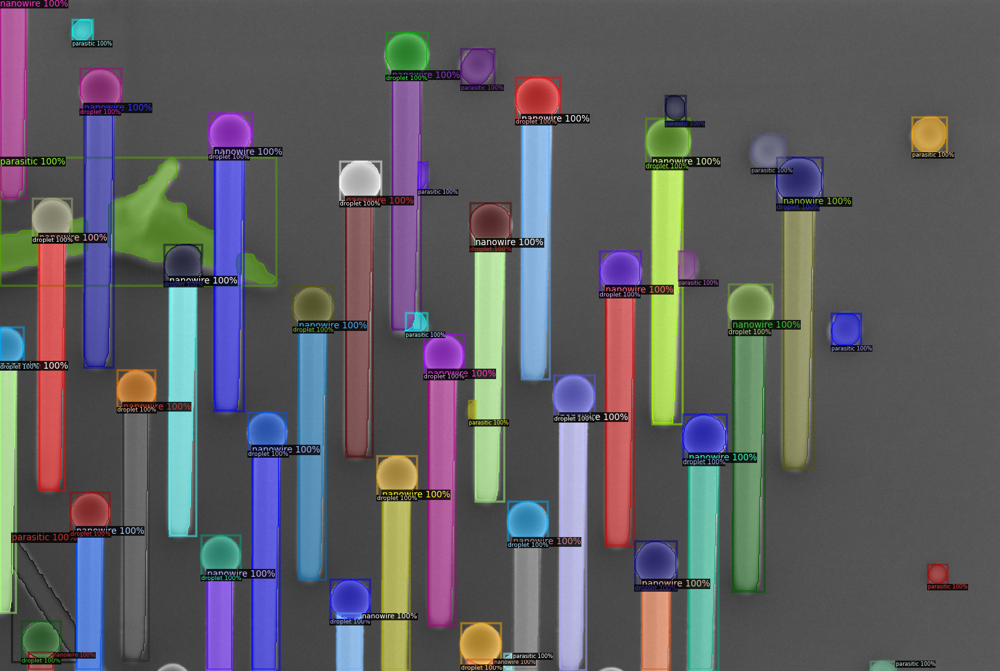

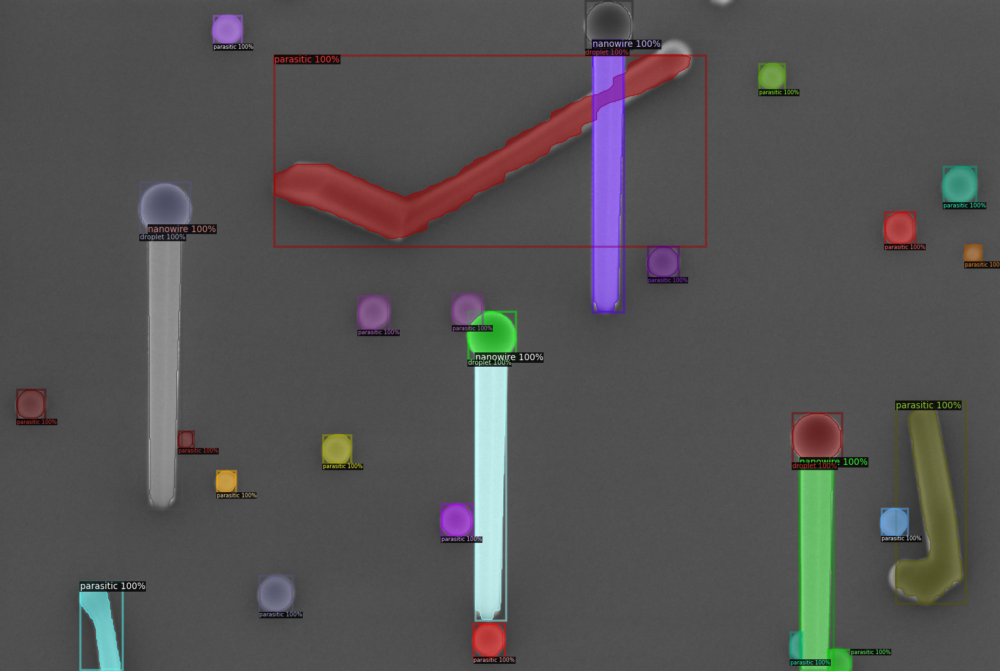

In [0]:
from detectron2.utils.visualizer import ColorMode
dataset_dicts = get_nw_mask_dicts_from_labelbox(dataset_dir + "/val")
for d in random.sample(dataset_dicts, 2):    
    im = cv2.imread(d["file_name"])
    outputs = predictor(im)
    v = Visualizer(im[:, :, ::-1],
                   metadata=nanowire_metadata, 
                   scale=1.5, 
                  #  instance_mode=ColorMode.IMAGE_BW   # remove the colors of unsegmented pixels
    )
    v = v.draw_instance_predictions(outputs["instances"].to("cpu"))
    cv2_imshow(v.get_image()[:, :, ::-1])

In [0]:
dataset_dicts[2]['file_name']

IndexError: ignored

We can also evaluate its performance using AP metric implemented in COCO API.
This gives an AP of ~70%. Not bad!

In [0]:
## Not working yet
from detectron2.evaluation import COCOEvaluator, inference_on_dataset
from detectron2.data import build_detection_test_loader
evaluator = COCOEvaluator("nw_masks_train", cfg, False)#, output_dir="./output/")
val_loader = build_detection_test_loader(cfg, "nw_masks_train")
inference_on_dataset(trainer.model, val_loader, evaluator)
# another equivalent way is to use trainer.test